# Exploring CMAPSS

## CMAPSS data description and preprocessing
NOTE: I got this beautiful description from one Jupyter Notebook I picked up during my research. I unfortunately cannot figure out the origin. Lost in the process.

CMAPSS stands for Commercial Modular Aero-Propulsion System Simulation. It is a system developed by NASA to study engine degradation. It is coded in MATLAB and Simulink (a toolbox of MATLAB). The engine under study is a turbofan engine (a jet engine). A turbofan engine has many components. A few important components are: Fan, Low Pressure Compressor (LPC), High Pressure Compressor (HPC), Low Pressure Turbine (LPT), High Pressure Turbine (HPT), etc. During operation, degradation occurs in each of the components. If degradation level in any component exceeds a threshold, the engine is said to have failed. We don't want jet engines to fail mid-air. Therefore, jet engines are inspected before every take off. This is a form of periodic maintenance that is not cost effective. But given the critical nature of operation (considering human lives involved), this form of maintenance strategy is justified. Even then, we need a system that can given us early warning if something is going to fail. An early warning, in many cases, may help us prepare for the problem, if not prevent it altogether. A sufficiently early warning will enable us to prevent the disaster. But if an early warning is too conservative (i.e., too early), it will lead to unnecessary waste of money. So, aim of a predictive maintenance system is to predict the RUL (Remaining Usefull Life) as accurately as possible such that it is neither too early nor too late.

In the setup, we don't study one engine at a time. Instead, simultaneously several engines are run. If degradation threshold of any engine is exceeded, that engine is turned off. From the data we can find out how many engines are being run in a particular experimental setup. We will discuss that later. First, we should get the data.

By changing fault modes and conditions, four different tests were conducted (thus, FD001, FD002, FD003, and FD004). For each test type, data were collected for training and test set. Training set data contains a number of engines being run simultaneously until it fails, i.e., for each engine data were collected to the point it failed. For example, training set of FD001 (`train_FD001.txt`) contains data for 100 engines till failure (How did I know `train_FD001.txt` contains data for 100 engines? We will find that out.). But test sets are slightly different. While the experiments were conducted till failure, all data till failure are not made public. Instead, data for an arbitrary number of cycles are provided for each engine of the test set. The task is then to predict after how many cycles, each engine will fail. This predicted value is our remaining useful life (RUL). Our goal is to predict RUL as accurately as possible from operational data. That's why we call it data-driven RUL prediction.

To given a concrete example, `test_FD001.txt` also tests 100 engines till failure. But for engine 1, data for 31 cycles are given. Does that mean engine 1 of test set failed after 31 cycles? No. This only means using the data for 31 cycles for engine 1 of the test set, we have to predict after how many cycles it would have actually failed. Actual RUL values for test set of FD001 are given in `RUL_FD001.txt`. From the RUL file we find that true RUL for engine 1 of FD001 is 112. So in reality engine 1 failed after 143 cycles (31 + 112). In this notebook, we will see how to get all these information from the dataset. Additionally some EDA of the chosen dataset (you can choose which dataset to work with upon beginning of the notebook).



### Modules

In [169]:
import keras
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
import seaborn as sns

# Setting seed for reproducibility
np.random.seed(1234)
PYTHONHASHSEED = 0

from sklearn import preprocessing
from sklearn.metrics import confusion_matrix, recall_score, precision_score
from keras.models import Sequential,load_model
from keras.layers import Dense, Dropout, LSTM
#Local files
from plot import plot_stacked_features, plot_all_units_overlay_colorbar

## FD00X

All 4 training and test datasets have 26 columns.
* `Column 0`: Corresponds to engine number
* `Column 1`: Corresponds to cycle number. If engine 1 fails after 192 cycles, the entries of second column for engine 1 will go from 1 to 192. Similarly for other engines. 
* `Columns 2,3,4`: 3 operational settings
1. Altitude

2. Mach number

3. Throttle Resolver Angle (TRA)
* `Columns 5-25`: 21 sensor measurements

(Damage Propagation Modeling for Aircraft Engine Run-to-Failure Simulation)



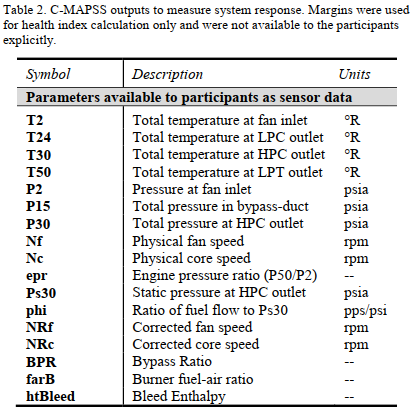

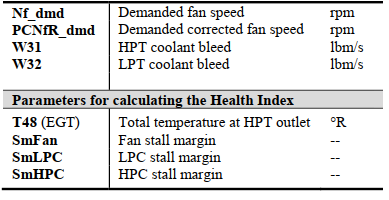

In [170]:
# Prompt the user for the flight condition
flight_condition = input("Please enter the flight condition (1-4): ")

# Validate the user input
while flight_condition not in ['1', '2', '3', '4']:
    print("Invalid input. Please try again.")
    flight_condition = input("Please enter the flight condition (1-4): ")

# Set the file names based on the flight condition
train_file = f'train_FD00{flight_condition}.txt'
test_file = f'test_FD00{flight_condition}.txt'
rul_file = f'RUL_FD00{flight_condition}.txt'

# Load the train dataset as a dataframe
train_dataset_path = os.path.join('CMAPSSData/', train_file)
train_data = pd.read_csv(train_dataset_path,  sep='\s+', engine='python', header=None)

# Load the test dataset as a dataframe
test_dataset_path = os.path.join('CMAPSSData/', test_file)
test_data = pd.read_csv(test_dataset_path, sep='\s+', engine='python', header=None)

# Load the RUL dataset as a dataframe
rul_dataset_path = os.path.join('CMAPSSData/', rul_file)
rul_data = pd.read_csv(rul_dataset_path, sep='\s+', engine='python', header=None)

# define column names for easy indexing
index_names = ['unit_nr', 'time_cycles']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names = [ 'T2', 'T24',
       'T30', 'T50', 'P2', 'P15', 'P30', 'Nf', 'Nc', 'epr', 'Ps30', 'phi',
       'NRf', 'NRc', 'BPR', 'farB', 'htBleed', 'Nf_dmd', 'PCNfR_dmd', 'W31',
       'W32']
columns = index_names + setting_names + sensor_names



<>:16: SyntaxWarning: invalid escape sequence '\s'
<>:20: SyntaxWarning: invalid escape sequence '\s'
<>:24: SyntaxWarning: invalid escape sequence '\s'
<>:16: SyntaxWarning: invalid escape sequence '\s'
<>:20: SyntaxWarning: invalid escape sequence '\s'
<>:24: SyntaxWarning: invalid escape sequence '\s'
C:\Users\flopp\AppData\Local\Temp\ipykernel_28268\2097677839.py:16: SyntaxWarning: invalid escape sequence '\s'
  train_data = pd.read_csv(train_dataset_path,  sep='\s+', engine='python', header=None)
C:\Users\flopp\AppData\Local\Temp\ipykernel_28268\2097677839.py:20: SyntaxWarning: invalid escape sequence '\s'
  test_data = pd.read_csv(test_dataset_path, sep='\s+', engine='python', header=None)
C:\Users\flopp\AppData\Local\Temp\ipykernel_28268\2097677839.py:24: SyntaxWarning: invalid escape sequence '\s'
  rul_data = pd.read_csv(rul_dataset_path, sep='\s+', engine='python', header=None)


#### Data Prep

Through various data interpretations one finds some of the sensor readings indiscriptive. Meaning they are constant throughout the time cycles and they are therefore kept out of the dataset for this work.

In [171]:
# Inspired by "Remaining useful life estimation in prognostics using deep convolution neural networks"
# Filter data to keep only the specified column indices. Currently just keeping all
kept_indices = list(range(len(columns)))
train_data = train_data.iloc[:, kept_indices]
test_data = test_data.iloc[:, kept_indices]

# Update column names accordingly
columns = [columns[i] for i in kept_indices]

### Training dataset

In [172]:
train_data.columns = columns
train_data.describe()

,unit_nr,time_cycles,setting_1,setting_2,setting_3,T2,T24,T30,T50,P2,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
count,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,...,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000
mean,131.082981,109.154746,23.998407,0.572056,94.046020,472.910207,579.672399,1419.971013,1205.442024,8.031986,...,266.069034,2334.557253,8066.597682,9.329654,0.023326,348.309511,2228.806358,97.756838,20.789296,12.473423
std,74.463862,69.180569,14.747376,0.310016,14.237735,26.389707,37.289399,105.946341,119.123428,3.613839,...,137.659507,128.068271,84.837950,0.749335,0.004711,27.754515,145.327980,5.364067,9.869331,5.921615
min,1.000000,1.000000,0.000000,0.000000,60.000000,445.000000,535.530000,1243.730000,1023.770000,3.910000,...,129.120000,2027.610000,7848.360000,8.335700,0.020000,303.000000,1915.000000,84.930000,10.180000,6.010500
25%,68.000000,52.000000,10.004600,0.250700,100.000000,445.000000,549.570000,1352.760000,1123.655000,3.910000,...,131.520000,2387.900000,8062.140000,8.677800,0.020000,331.000000,2212.000000,100.000000,10.910000,6.546300
50%,131.000000,104.000000,25.001300,0.700000,100.000000,462.540000,555.980000,1369.180000,1138.890000,7.050000,...,183.200000,2388.080000,8082.540000,9.310900,0.020000,335.000000,2223.000000,100.000000,14.880000,8.929200
75%,195.000000,157.000000,41.998000,0.840000,100.000000,491.190000,607.340000,1499.370000,1306.850000,10.520000,...,371.260000,2388.170000,8127.195000,9.386900,0.030000,369.000000,2324.000000,100.000000,28.470000,17.083200
max,260.000000,378.000000,42.008000,0.842000,100.000000,518.670000,644.520000,1612.880000,1439.230000,14.620000,...,523.370000,2390.480000,8268.500000,11.066900,0.030000,399.000000,2388.000000,100.000000,39.340000,23.590100


In [173]:
train_data

,unit_nr,time_cycles,setting_1,setting_2,setting_3,T2,T24,T30,T50,P2,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
0,1,1,34.9983,0.8400,100.0,449.44,555.32,1358.61,1137.23,5.48,...,183.06,2387.72,8048.56,9.3461,0.02,334,2223,100.00,14.73,8.8071
1,1,2,41.9982,0.8408,100.0,445.00,549.90,1353.22,1125.78,3.91,...,130.42,2387.66,8072.30,9.3774,0.02,330,2212,100.00,10.41,6.2665
2,1,3,24.9988,0.6218,60.0,462.54,537.31,1256.76,1047.45,7.05,...,164.22,2028.03,7864.87,10.8941,0.02,309,1915,84.93,14.08,8.6723
3,1,4,42.0077,0.8416,100.0,445.00,549.51,1354.03,1126.38,3.91,...,130.72,2387.61,8068.66,9.3528,0.02,329,2212,100.00,10.59,6.4701
4,1,5,25.0005,0.6203,60.0,462.54,537.07,1257.71,1047.93,7.05,...,164.31,2028.00,7861.23,10.8963,0.02,309,1915,84.93,14.13,8.5286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53754,260,312,20.0037,0.7000,100.0,491.19,608.79,1495.60,1269.51,9.35,...,314.05,2389.02,8169.64,9.3035,0.03,369,2324,100.00,24.36,14.5189
53755,260,313,10.0022,0.2510,100.0,489.05,605.81,1514.32,1324.12,10.52,...,371.22,2388.42,8245.36,8.7586,0.03,374,2319,100.00,28.10,16.9454
53756,260,314,25.0041,0.6200,60.0,462.54,537.48,1276.24,1057.92,7.05,...,163.74,2030.33,7971.25,11.0657,0.02,310,1915,84.93,14.19,8.5503
53757,260,315,25.0033,0.6220,60.0,462.54,537.84,1272.95,1066.30,7.05,...,164.37,2030.35,7972.47,11.0537,0.02,311,1915,84.93,14.05,8.3729


#### Min-max normalization of features

In [174]:
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0, 1))
indices_to_be_scaled = list(range(2, len(train_data.columns)))
scaled_indices_array_train = min_max_scaler.fit_transform(train_data.iloc[:, indices_to_be_scaled])

In [175]:
train_data_scaled = train_data.copy()
count = 0
if flight_condition == '2'or '4':
    scale_index_start = 2
else:
    scale_index_start = 5
for feature in train_data.columns[scale_index_start:]:
    train_data_scaled[feature] = scaled_indices_array_train[:, count]
    count += 1

In [176]:
train_data_scaled.describe()

,unit_nr,time_cycles,setting_1,setting_2,setting_3,T2,T24,T30,T50,P2,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
count,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,...,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000
mean,131.082981,109.154746,0.571282,0.679402,0.851151,0.378854,0.405013,0.477424,0.437279,0.384873,...,0.347366,0.845888,0.519440,0.363926,0.332595,0.471974,0.663438,0.851151,0.363830,0.367638
std,74.463862,69.180569,0.351061,0.368190,0.355943,0.358215,0.342136,0.287001,0.286727,0.337427,...,0.349168,0.352932,0.201928,0.274361,0.471147,0.289110,0.307247,0.355943,0.338454,0.336846
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,68.000000,52.000000,0.238159,0.297743,1.000000,0.000000,0.128819,0.295354,0.240420,0.000000,...,0.006088,0.992890,0.508830,0.125256,0.000000,0.291667,0.627907,1.000000,0.025034,0.030479
50%,131.000000,104.000000,0.595156,0.831354,1.000000,0.238089,0.187632,0.339835,0.277090,0.293184,...,0.137172,0.993386,0.557386,0.357059,0.000000,0.333333,0.651163,1.000000,0.161180,0.166028
75%,195.000000,157.000000,0.999762,0.997625,1.000000,0.626985,0.658868,0.692510,0.681365,0.617180,...,0.614179,0.993634,0.663672,0.384886,1.000000,0.687500,0.864693,1.000000,0.627229,0.629861
max,260.000000,378.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#### RUL feature on train_data
Before we start plotting and investigating the various features, a proces for including a measure of RUL in the training data is done.

##### After how many cycles does each engine fail? (This is highly inspired by 'CMAPS_data_description_and_preprocessing.ipynb')

In [177]:
num_cycles_to_failure = train_data_scaled.groupby(by = 'unit_nr')['time_cycles'].count()
num_cycles_to_failure.values

array([149, 269, 206, 235, 154, 175, 174, 151, 199, 184, 271, 249, 227,
       193, 209, 154, 180, 209, 163, 154, 189, 192, 211, 191, 205, 187,
       176, 200, 151, 166, 343, 281, 195, 205, 196, 203, 210, 177, 214,
       193, 262, 221, 211, 205, 151, 201, 246, 239, 168, 222, 293, 174,
       148, 199, 159, 163, 140, 162, 194, 177, 218, 184, 168, 282, 206,
       170, 145, 185, 136, 156, 194, 196, 239, 158, 231, 244, 185, 161,
       181, 221, 288, 200, 170, 259, 347, 190, 170, 365, 188, 188, 245,
       188, 189, 306, 198, 208, 145, 167, 202, 212, 211, 164, 280, 228,
       303, 272, 145, 156, 220, 221, 200, 378, 232, 203, 206, 207, 177,
       344, 174, 129, 210, 185, 226, 267, 168, 199, 256, 303, 202, 182,
       280, 183, 159, 247, 294, 160, 148, 200, 194, 214, 163, 208, 166,
       224, 251, 263, 207, 279, 289, 222, 177, 184, 292, 193, 226, 299,
       237, 308, 241, 212, 224, 194, 203, 249, 165, 204, 232, 217, 185,
       179, 258, 174, 151, 193, 202, 164, 181, 148, 181, 297, 25

We can see that engine 1 failed after 192 cycles. Engine 2 failed after 287 cycles and similarly for other engines.


##### How to find training RUL values?

Observe that there is no RUL data provided for training set. Do we need that? In fact, we can calculate RUL values from training data itself. Remember that training data contains run to failure data of all engines.

Engine 1 fails after 192 cycles. So at the first cycle of engine 1, its RUL is 191. After cycle 2, its RUL is 190 and so on. As it fails after 192 cycles, at 192nd cycle, its RUL is 0. This type of degradation model is called linear degradation model. From the start of the cycle it decreases gradually to 0 at the last cycle.

Apart from linear degradation model, there is another degradation model called `piecewise linear` degradation model that is also widely used. In this model, at the beginning (for a number of cycles), RUL is assigned to a fixed number. The fixed number is called early RUL. When RUL value reaches early RUL, from there on RUL follows a linear degradation model.

To illustrate both degradation model, we will plot RUL values for engine 1 using both models. RUL of engine 1 is 192 (found above). For piecewise linear degradation model, we take early RUL to be 125 (It's just a choice. There is no definite rule for selecting this value).

In [178]:
engine_1_linear_degradation_model = np.arange(192-1, -1, -1)

# Piecewise_linear_degradation model
early_rul = 125
engine_1_piecewise_linear_degradation_model = np.append(early_rul*np.ones(shape = (192-early_rul,)),
                                                        np.arange(early_rul-1, -1, -1))

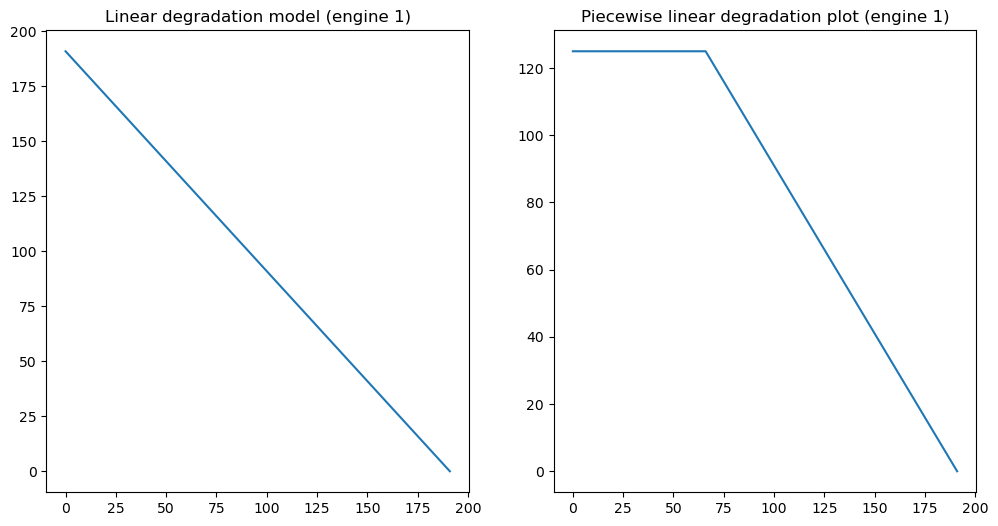

In [179]:
plt.figure(figsize = (12, 6))
plt.subplot(121)
plt.plot(engine_1_linear_degradation_model)
plt.title("Linear degradation model (engine 1)")
plt.subplot(122)
plt.plot(engine_1_piecewise_linear_degradation_model)
plt.title("Piecewise linear degradation plot (engine 1)")
plt.show()

Observe that while the linear degradation curve starts at 191 and ends at 0, piecewise linear degradation curve starts at 125, stays at 125 for some time and then linearly degrades to 0. From encounter of early RUL to full degradation a steeper linear slope is met compared to the linear degradation from onset.  

We can similarly find RUL values for other engines. But individually finding RUL for each engine is boring. So we will write a function that automatically finds RUL values for both models if it is supplied with the total number of cycles. --> look at preprocessing.ipynb

### Test Dataset (and RUL Dataset)

In [180]:
test_data.columns = columns
test_data.describe()

,unit_nr,time_cycles,setting_1,setting_2,setting_3,T2,T24,T30,T50,P2,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
count,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000,...,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000,33991.000000
mean,127.528346,81.223647,23.975176,0.571154,94.066665,472.930049,579.591704,1418.562090,1203.086538,8.039014,...,266.499351,2334.696674,8063.638811,9.315214,0.023141,347.938807,2229.025301,97.764616,20.839067,12.503918
std,74.144727,58.892845,14.778958,0.310998,14.217415,26.454686,37.338929,105.979169,119.039415,3.623831,...,138.104790,127.888432,83.829038,0.747609,0.004642,27.759465,145.235683,5.356411,9.908785,5.944582
min,1.000000,1.000000,0.000000,0.000000,60.000000,445.000000,535.410000,1245.160000,1030.090000,3.910000,...,129.310000,2027.790000,7851.310000,8.330200,0.020000,303.000000,1915.000000,84.930000,10.180000,6.123100
25%,65.000000,34.000000,10.004600,0.250600,100.000000,449.440000,549.480000,1351.640000,1122.520000,5.480000,...,163.775000,2387.890000,8061.375000,8.663500,0.020000,330.000000,2212.000000,100.000000,13.990000,8.407150
50%,128.000000,70.000000,25.001300,0.700000,100.000000,462.540000,555.830000,1367.370000,1134.160000,7.050000,...,183.260000,2388.060000,8080.280000,9.303500,0.020000,334.000000,2223.000000,100.000000,14.900000,8.938800
75%,189.000000,119.000000,35.008000,0.840000,100.000000,491.190000,607.260000,1498.300000,1305.455000,10.520000,...,371.450000,2388.130000,8125.840000,9.374500,0.030000,369.000000,2324.000000,100.000000,28.520000,17.111200
max,259.000000,367.000000,42.008000,0.842000,100.000000,518.670000,644.320000,1609.690000,1434.120000,14.620000,...,523.220000,2389.960000,8243.100000,11.030000,0.030000,398.000000,2388.000000,100.000000,39.320000,23.614100


In [181]:
test_data

,unit_nr,time_cycles,setting_1,setting_2,setting_3,T2,T24,T30,T50,P2,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
0,1,1,9.9987,0.2502,100.0,489.05,605.03,1497.17,1304.99,10.52,...,371.69,2388.18,8114.10,8.6476,0.03,369,2319,100.00,28.42,17.1551
1,1,2,20.0026,0.7000,100.0,491.19,607.82,1481.20,1246.11,9.35,...,315.32,2388.12,8053.06,9.2405,0.02,364,2324,100.00,24.29,14.8039
2,1,3,35.0045,0.8400,100.0,449.44,556.00,1359.08,1128.36,5.48,...,183.04,2387.75,8053.04,9.3472,0.02,333,2223,100.00,14.98,8.9125
3,1,4,42.0066,0.8410,100.0,445.00,550.17,1349.69,1127.89,3.91,...,130.40,2387.72,8066.90,9.3961,0.02,332,2212,100.00,10.35,6.4181
4,1,5,24.9985,0.6213,60.0,462.54,536.72,1253.18,1050.69,7.05,...,164.56,2028.05,7865.66,10.8682,0.02,305,1915,84.93,14.31,8.5740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33986,259,119,35.0015,0.8403,100.0,449.44,555.56,1366.01,1129.47,5.48,...,183.05,2388.39,8088.36,9.3215,0.02,334,2223,100.00,14.94,8.9065
33987,259,120,42.0066,0.8405,100.0,445.00,549.42,1351.13,1123.86,3.91,...,130.74,2388.31,8108.48,9.3542,0.02,332,2212,100.00,10.57,6.4075
33988,259,121,42.0061,0.8400,100.0,445.00,549.65,1349.14,1118.91,3.91,...,130.96,2388.34,8098.77,9.3836,0.02,331,2212,100.00,10.57,6.4805
33989,259,122,0.0024,0.0003,100.0,518.67,642.58,1589.61,1408.16,14.62,...,522.25,2388.00,8161.85,8.4279,0.03,393,2388,100.00,39.08,23.3589


#### Min-max normalization of features

#### RUL

In [182]:
rul_data.columns = ['RUL']
rul_data

,RUL
0,18
1,79
2,106
3,110
4,15
...,...
254,122
255,191
256,56
257,131


## Exploratory Data Analysis

#### Plotting the sensor readings for 1 unit

In [183]:
if flight_condition == '2':
    # Prompt the user for the unit_nr condition
    unit_nr_condition = input("Please enter the unit_nr condition (1-260): ")

    # Validate the user input
    while unit_nr_condition not in list(map(str, list(range(1, 261)))):
        print("Invalid input. Please try again.")
        unit_nr_condition = input("Please enter the unit_nr condition (1-260): ")

    train_data_scaled_unique_unit_nr = train_data_scaled[train_data_scaled['unit_nr'] == int(unit_nr_condition)]
elif flight_condition == '4':
    # Prompt the user for the unit_nr condition
    unit_nr_condition = input("Please enter the unit_nr condition (1-249): ")

    # Validate the user input
    while unit_nr_condition not in list(map(str, list(range(1, 250)))):
        print("Invalid input. Please try again.")
        unit_nr_condition = input("Please enter the unit_nr condition (1-249): ")

    train_data_scaled_unique_unit_nr = train_data_scaled[train_data_scaled['unit_nr'] == int(unit_nr_condition)]
else:
    unit_nr_condition = input("Please enter the unit_nr condition (1-100): ")
    # Validate the user input
    while unit_nr_condition not in list(map(str, list(range(1, 101)))):
        print("Invalid input. Please try again.")
        unit_nr_condition = input("Please enter the unit_nr condition (1-100): ")

    train_data_scaled_unique_unit_nr = train_data_scaled[train_data_scaled['unit_nr'] == int(unit_nr_condition)]

c:\Users\flopp\OneDrive - Aarhus universitet\Aarhus Universitet\Bachelor Project\plot.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 4))


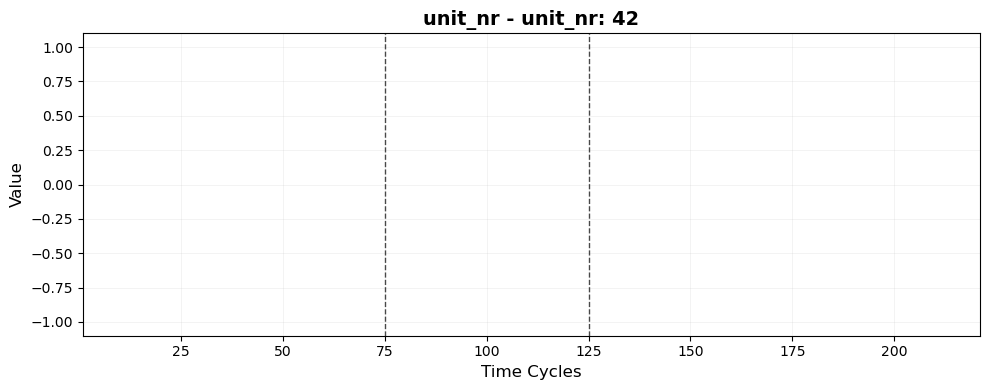

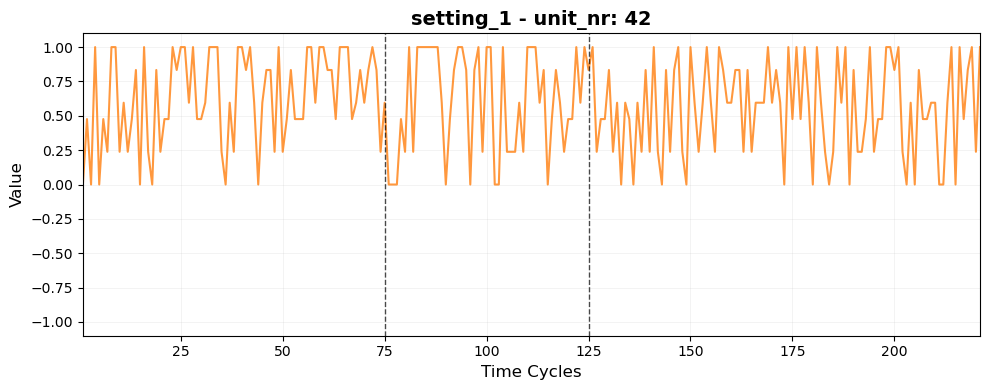

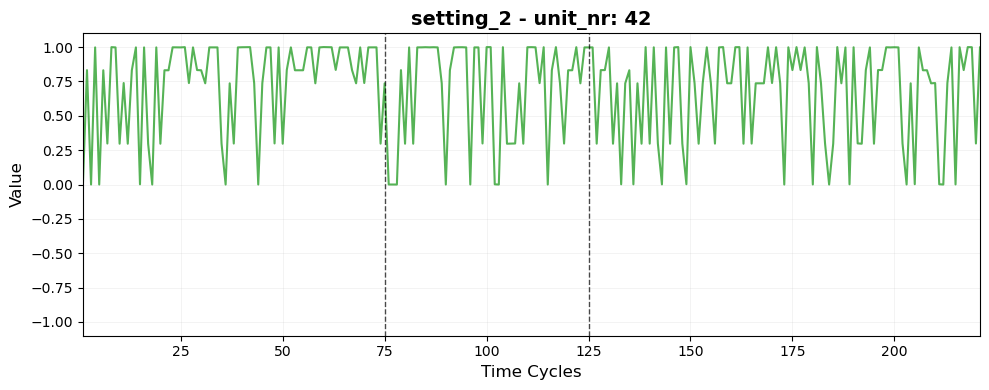

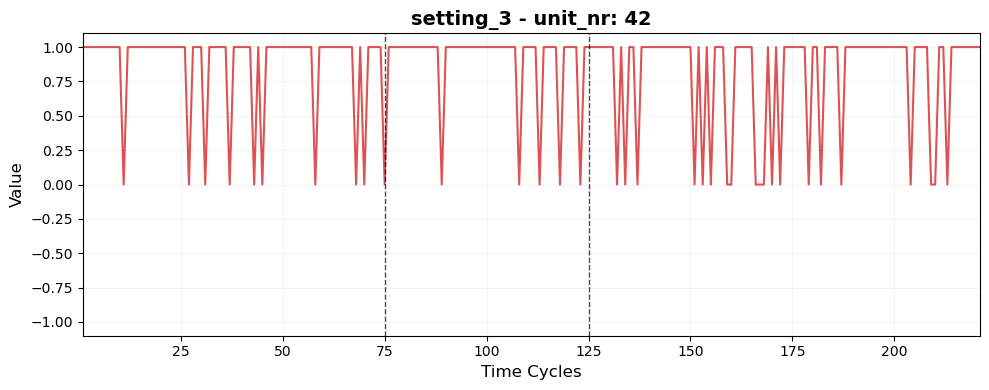

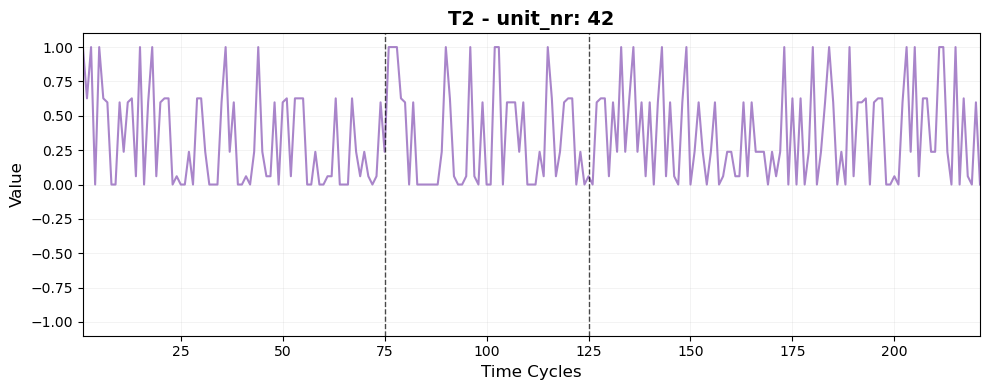

...

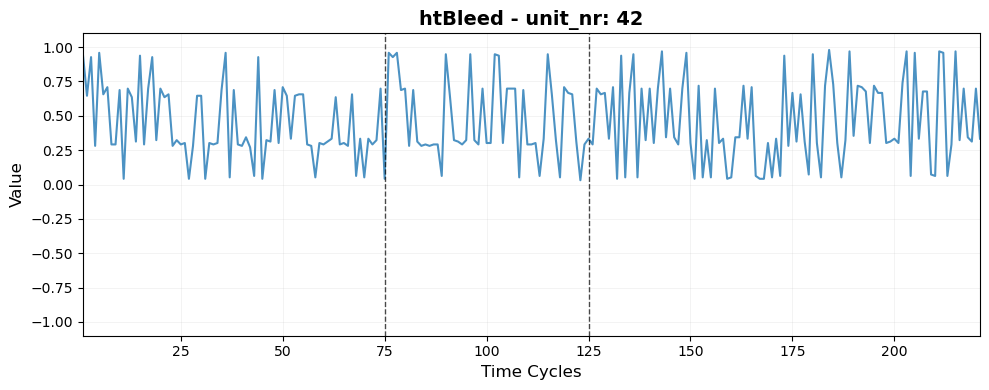

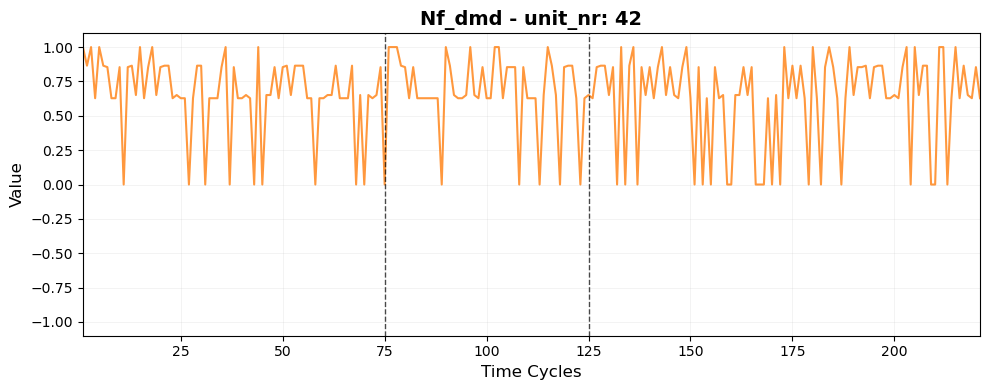

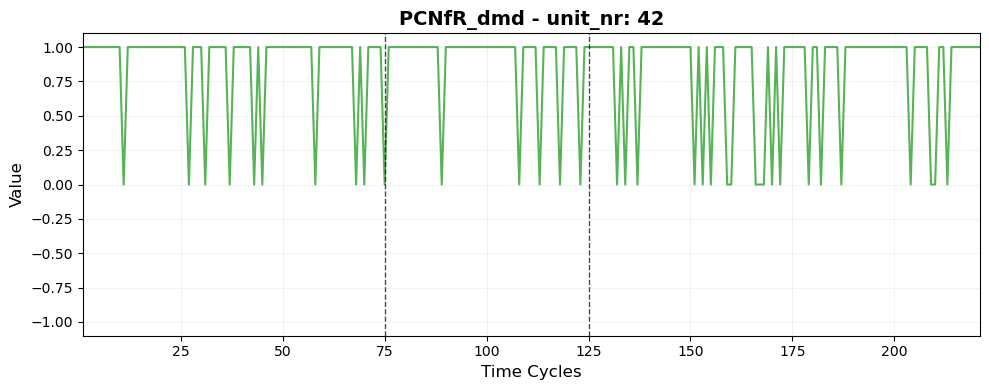

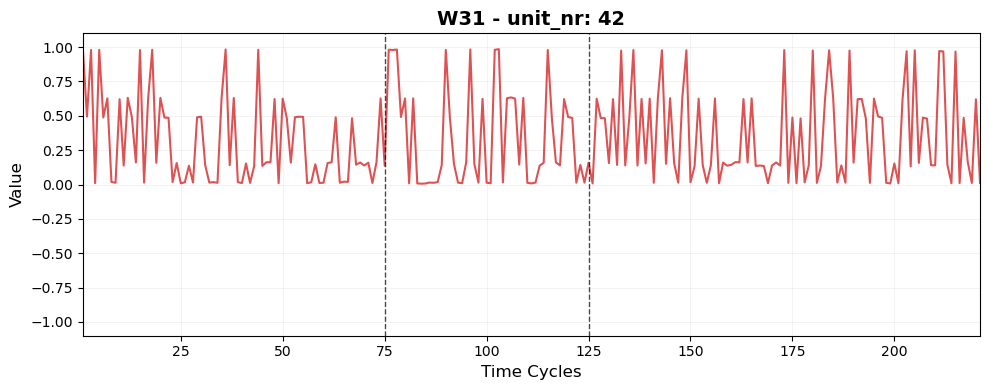

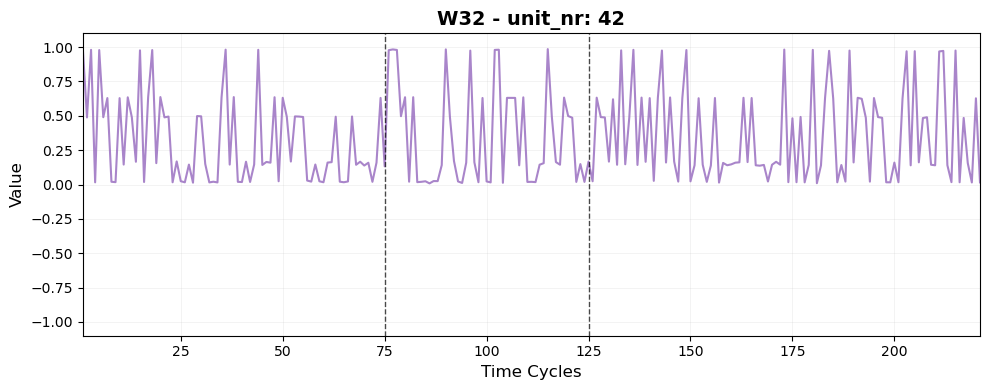

In [184]:
# Create the plot
x_lim = [train_data_scaled_unique_unit_nr['time_cycles'].min(), train_data_scaled_unique_unit_nr['time_cycles'].max()]
fig, ax = plot_stacked_features(train_data_scaled_unique_unit_nr, unit_nr_condition, time_col='time_cycles', x_lim=x_lim, vertical_lines=[75, 125])
#plt.savefig('my_plot.png', dpi=300, bbox_inches='tight')
plt.show()

#### Plotting the sensor readings for all units

c:\Users\flopp\OneDrive - Aarhus universitet\Aarhus Universitet\Bachelor Project\plot.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 4))


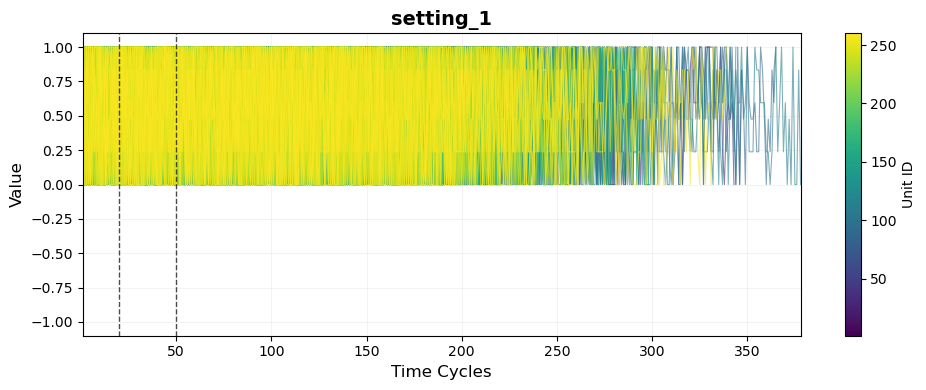

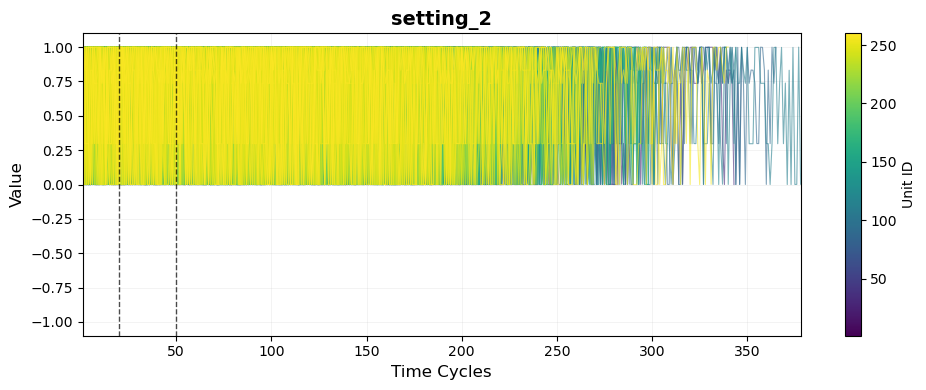

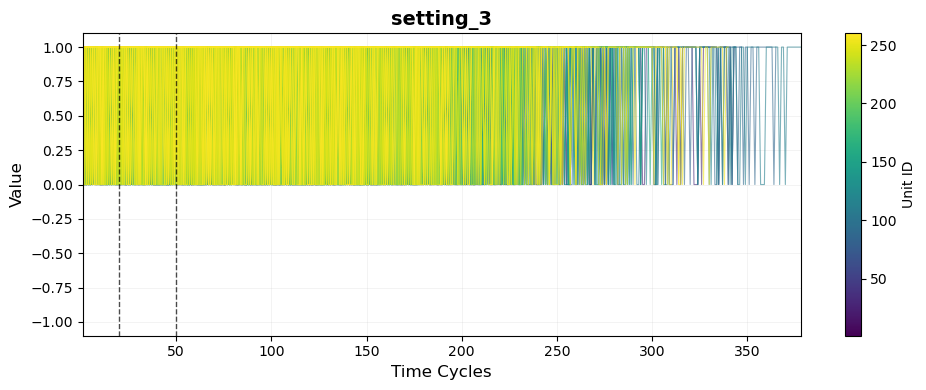

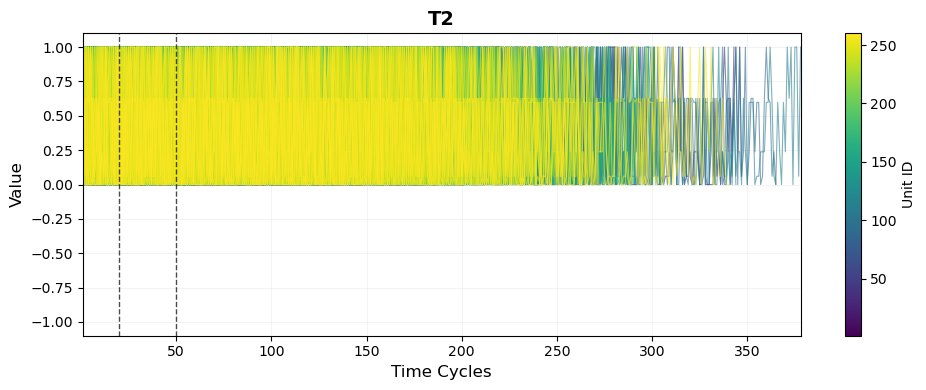

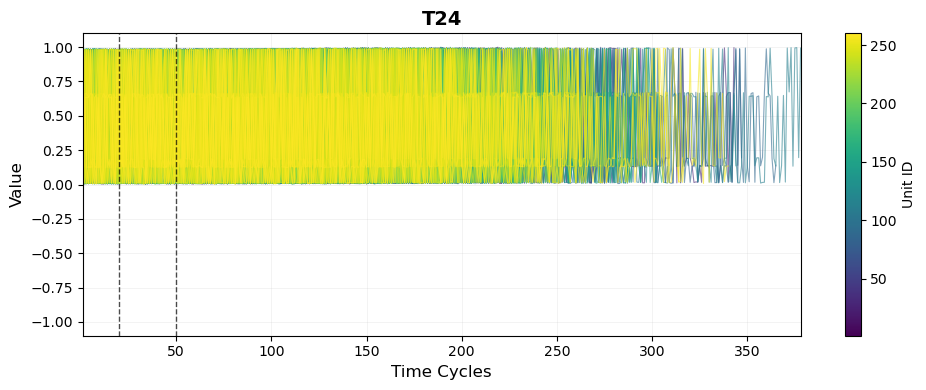

...

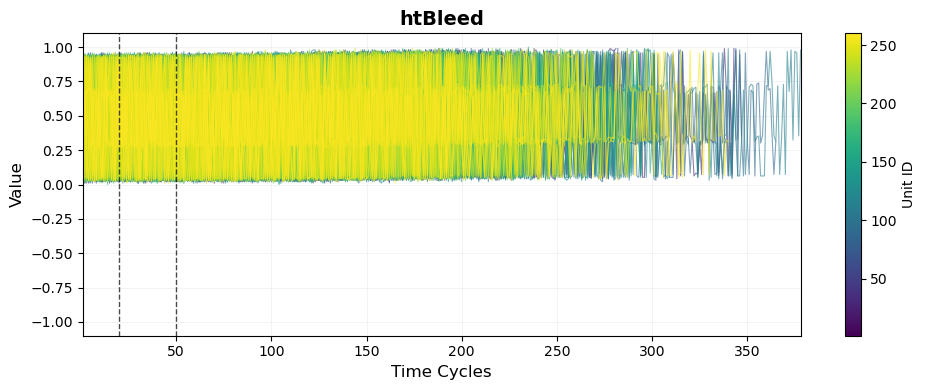

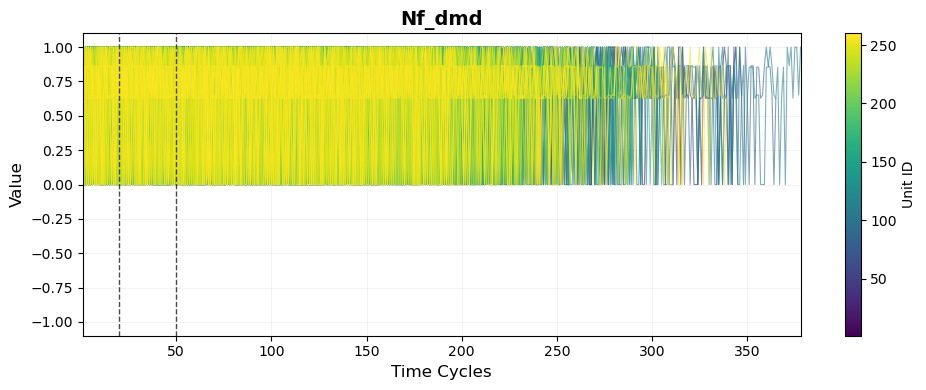

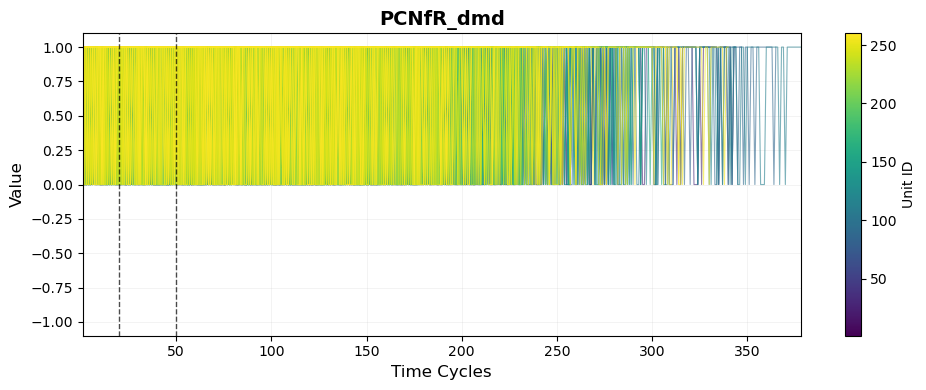

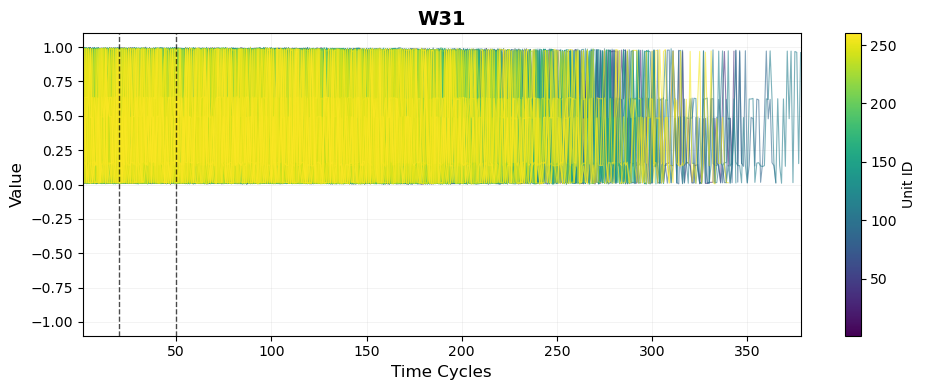

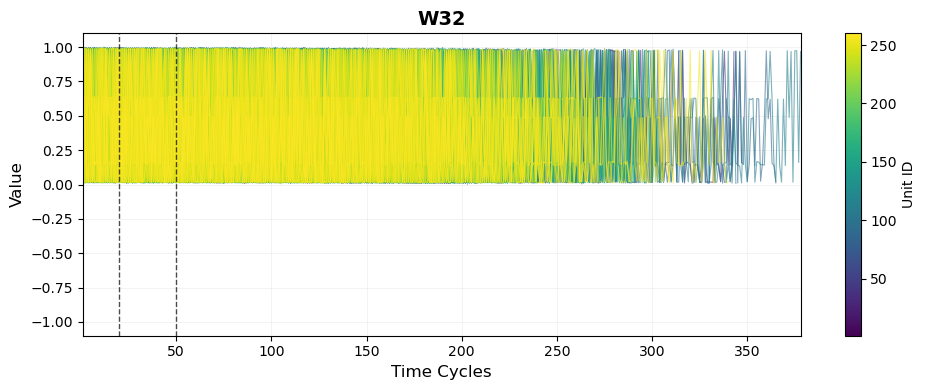

In [185]:
# Create the plot
x_lim = [train_data['time_cycles'].min(), train_data['time_cycles'].max()]
fig, ax = plot_all_units_overlay_colorbar(train_data_scaled, x_lim = x_lim, vertical_lines=[20, 50])
#plt.savefig('my_plot.png', dpi=300, bbox_inches='tight')
plt.show()

## Clustering Normalization based on Operating Conditions

For when exploring FD002 and FD004 we encounter, as can be seen from "Exploratory Data Analysis", an errorness divergence in data normalization approaches during our preprocessing. There is clearly a distinct difference between these normalized sensor readings and for those of FD001 and FD003 with one operational setting.
Following 


we should investigate Clustering Normalization based on the Operating Conditions of FD002 and FD004 to which they showcase the importance for correct normalization of data. Additionally this will yield good evaluation for testing the LSTM later in the project. As they say in their paper not many data-driven methodologies implementing LSTM have taken this into account.

To address this, we:
1. Cluster the operating conditions using the operational setting variables.
2. Assign each data point to a cluster.
3. Perform normalization *within each cluster* instead of globally.

It is desired to replicate the figure of the paper

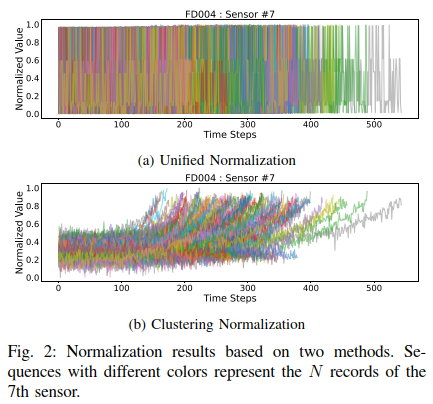

In [186]:
#Sanity code for controlling whether to continue or not.

STOP_NOTEBOOK = False
if (flight_condition == 1):
    STOP_NOTEBOOK = True
elif (flight_condition == 3):
    STOP_NOTEBOOK = True
if(STOP_NOTEBOOK):
    print("Stopping notebook given we are not looking at either FD002 or FD004")
    quit()
else:
    print("Going forward with Clustered Normalization")

Going forward with Clustered Normalization


Let us get the raw data again. We do not normalize the test_data earlier in the notebook so there is no need rereading that

In [187]:
# Set the file names based on the flight condition
train_file = f'train_FD00{flight_condition}.txt'

# Load the train dataset as a dataframe
train_dataset_path = os.path.join('CMAPSSData/', train_file)
train_data = pd.read_csv(train_dataset_path,  sep='\s+', engine='python', header=None)

<>:6: SyntaxWarning: invalid escape sequence '\s'
<>:6: SyntaxWarning: invalid escape sequence '\s'
C:\Users\flopp\AppData\Local\Temp\ipykernel_28268\56172349.py:6: SyntaxWarning: invalid escape sequence '\s'
  train_data = pd.read_csv(train_dataset_path,  sep='\s+', engine='python', header=None)


In [188]:
train_data.columns = columns
train_data.describe()

,unit_nr,time_cycles,setting_1,setting_2,setting_3,T2,T24,T30,T50,P2,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
count,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,...,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000,53759.000000
mean,131.082981,109.154746,23.998407,0.572056,94.046020,472.910207,579.672399,1419.971013,1205.442024,8.031986,...,266.069034,2334.557253,8066.597682,9.329654,0.023326,348.309511,2228.806358,97.756838,20.789296,12.473423
std,74.463862,69.180569,14.747376,0.310016,14.237735,26.389707,37.289399,105.946341,119.123428,3.613839,...,137.659507,128.068271,84.837950,0.749335,0.004711,27.754515,145.327980,5.364067,9.869331,5.921615
min,1.000000,1.000000,0.000000,0.000000,60.000000,445.000000,535.530000,1243.730000,1023.770000,3.910000,...,129.120000,2027.610000,7848.360000,8.335700,0.020000,303.000000,1915.000000,84.930000,10.180000,6.010500
25%,68.000000,52.000000,10.004600,0.250700,100.000000,445.000000,549.570000,1352.760000,1123.655000,3.910000,...,131.520000,2387.900000,8062.140000,8.677800,0.020000,331.000000,2212.000000,100.000000,10.910000,6.546300
50%,131.000000,104.000000,25.001300,0.700000,100.000000,462.540000,555.980000,1369.180000,1138.890000,7.050000,...,183.200000,2388.080000,8082.540000,9.310900,0.020000,335.000000,2223.000000,100.000000,14.880000,8.929200
75%,195.000000,157.000000,41.998000,0.840000,100.000000,491.190000,607.340000,1499.370000,1306.850000,10.520000,...,371.260000,2388.170000,8127.195000,9.386900,0.030000,369.000000,2324.000000,100.000000,28.470000,17.083200
max,260.000000,378.000000,42.008000,0.842000,100.000000,518.670000,644.520000,1612.880000,1439.230000,14.620000,...,523.370000,2390.480000,8268.500000,11.066900,0.030000,399.000000,2388.000000,100.000000,39.340000,23.590100


In [189]:
#Filter data to construct clusters
op_settings = ['setting_1', 'setting_2', 'setting_3']

X_cluster = train_data[op_settings].values

### Clustering (KMeans)

In [190]:
from sklearn.cluster import KMeans

n_clusters = 6  # There are 6 distinct operational settings for FD002 and FD004

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
train_data['cluster'] = kmeans.fit_predict(X_cluster)

# Apply same clustering to test data
test_data['cluster'] = kmeans.predict(test_data[op_settings].values)

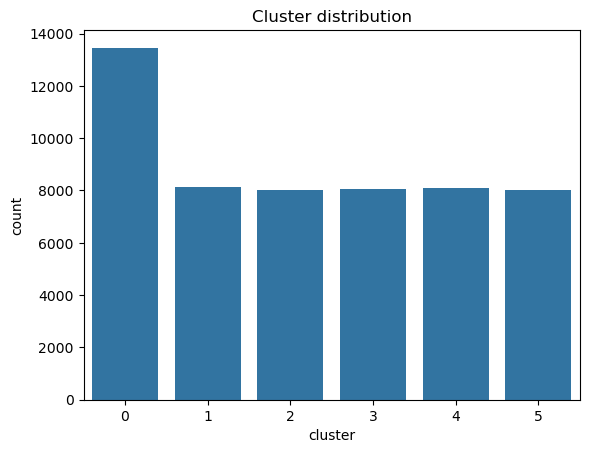

In [191]:
# Sanity check to whether clustering have been succesful
sns.countplot(x='cluster', data=train_data)
plt.title("Cluster distribution")
plt.show()

Normalizing based on cluster ID :)

In [192]:
scalers = {}

train_scaled_list = []
test_scaled_list = []

for cluster_id in range(n_clusters):
    
    # Select cluster data
    train_cluster = train_data[train_data['cluster'] == cluster_id].copy()
    test_cluster = test_data[test_data['cluster'] == cluster_id].copy()
    
    # Fit ONLY on train cluster
    train_cluster[sensor_names] = min_max_scaler.fit_transform(train_cluster[sensor_names])
    
    # Apply to test cluster
    test_cluster[sensor_names] = min_max_scaler.transform(test_cluster[sensor_names])
    
    scalers[cluster_id] = min_max_scaler
    
    train_scaled_list.append(train_cluster)
    test_scaled_list.append(test_cluster)

# Combine back
train_data_cluster_scaled = pd.concat(train_scaled_list).sort_index()
test_data_cluster_scaled = pd.concat(test_scaled_list).sort_index()

#### Plotting

In [193]:
if flight_condition == '2':
    # Prompt the user for the unit_nr condition
    unit_nr_condition = input("Please enter the unit_nr condition (1-260): ")

    # Validate the user input
    while unit_nr_condition not in list(map(str, list(range(1, 261)))):
        print("Invalid input. Please try again.")
        unit_nr_condition = input("Please enter the unit_nr condition (1-260): ")

    train_data_cluster_scaled_unique_unit_nr = train_data_cluster_scaled[train_data_scaled['unit_nr'] == int(unit_nr_condition)]
elif flight_condition == '4':
    # Prompt the user for the unit_nr condition
    unit_nr_condition = input("Please enter the unit_nr condition (1-249): ")

    # Validate the user input
    while unit_nr_condition not in list(map(str, list(range(1, 250)))):
        print("Invalid input. Please try again.")
        unit_nr_condition = input("Please enter the unit_nr condition (1-249): ")

    train_data_cluster_scaled_unique_unit_nr = train_data_cluster_scaled[train_data_scaled['unit_nr'] == int(unit_nr_condition)]
else:
    unit_nr_condition = input("Please enter the unit_nr condition (1-100): ")
    # Validate the user input
    while unit_nr_condition not in list(map(str, list(range(1, 101)))):
        print("Invalid input. Please try again.")
        unit_nr_condition = input("Please enter the unit_nr condition (1-100): ")

    train_data_cluster_scaled_unique_unit_nr = train_data_cluster_scaled[train_data_scaled['unit_nr'] == int(unit_nr_condition)]

c:\Users\flopp\OneDrive - Aarhus universitet\Aarhus Universitet\Bachelor Project\plot.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 4))


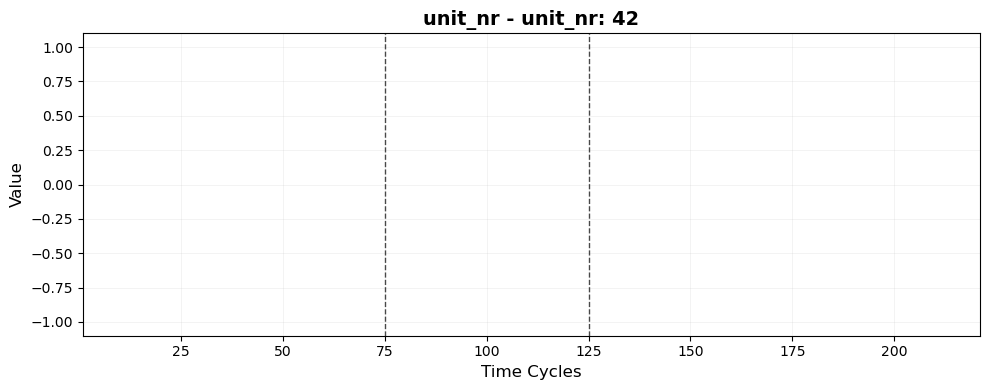

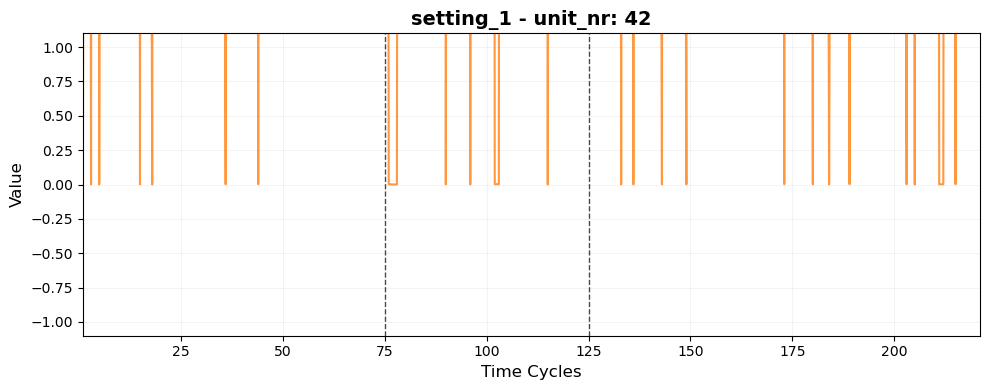

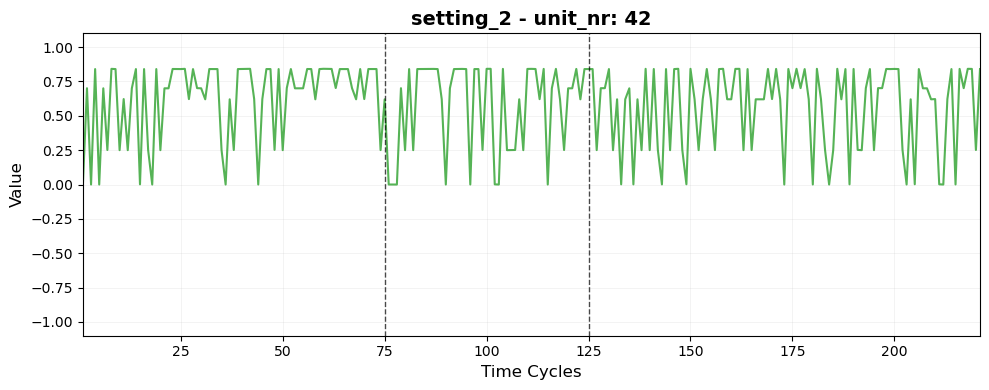

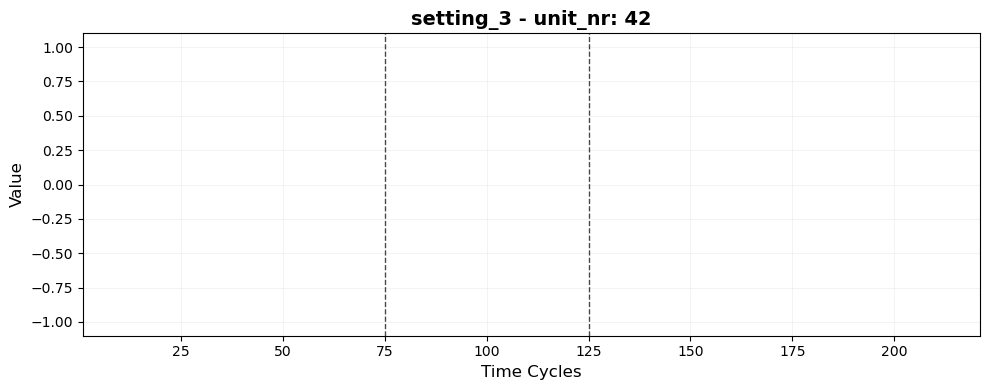

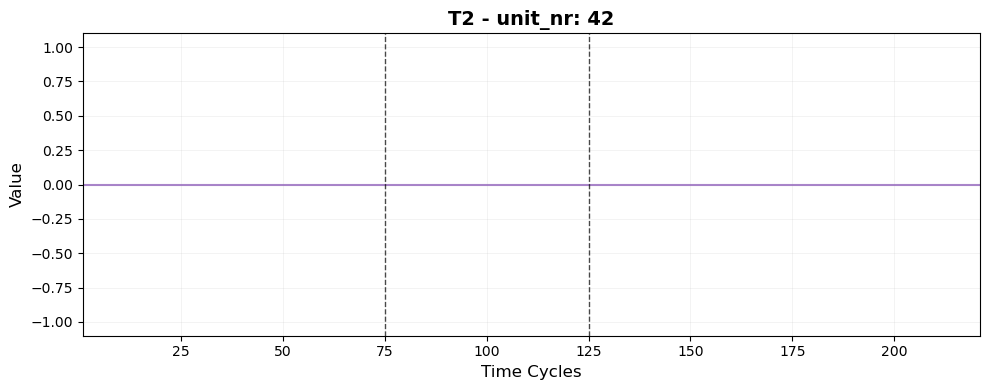

...

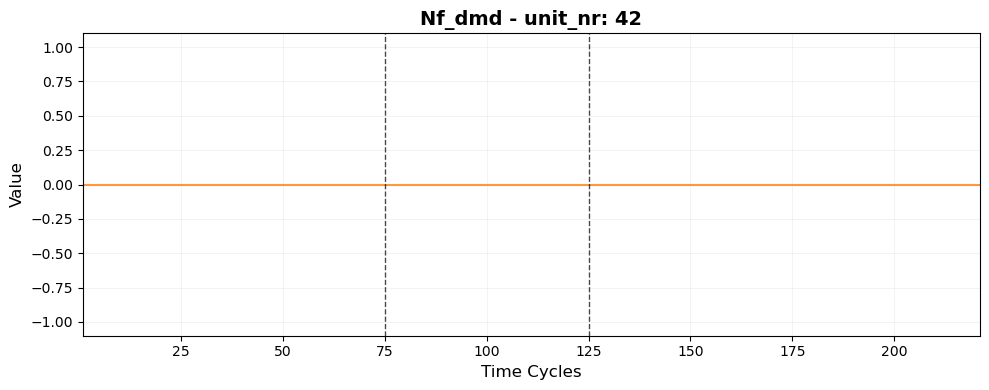

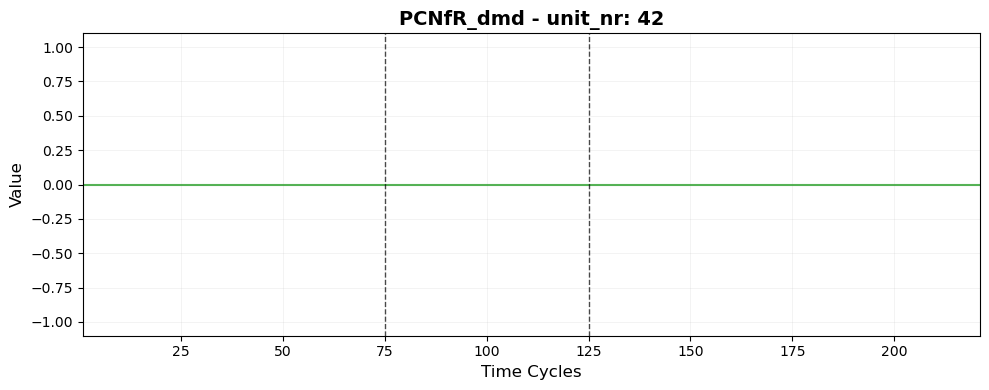

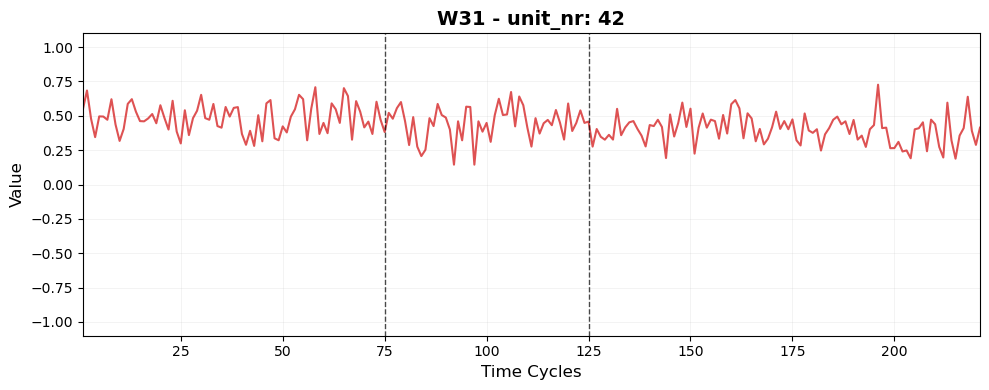

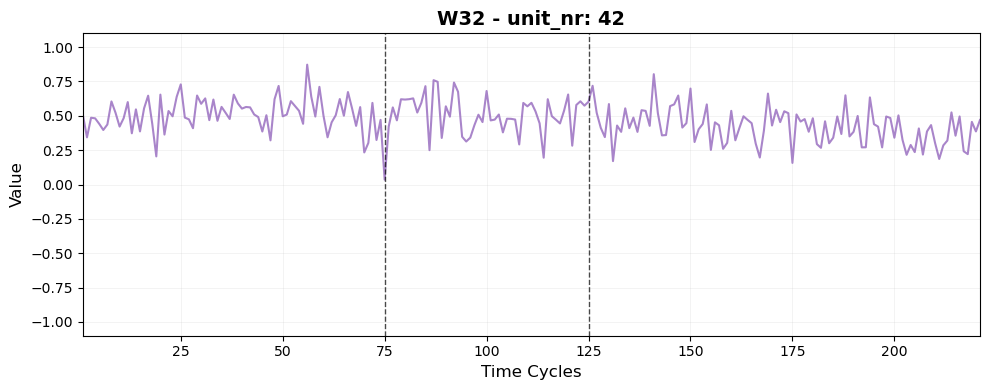

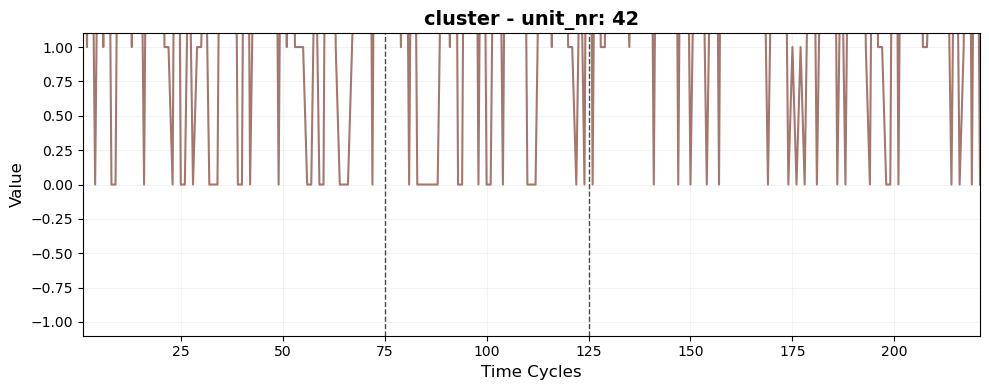

In [194]:
# Create the plot
x_lim = [train_data_cluster_scaled_unique_unit_nr['time_cycles'].min(), train_data_cluster_scaled_unique_unit_nr['time_cycles'].max()]
fig, ax = plot_stacked_features(train_data_cluster_scaled_unique_unit_nr, unit_nr_condition, time_col='time_cycles', x_lim=x_lim, vertical_lines=[75, 125])
#plt.savefig('my_plot.png', dpi=300, bbox_inches='tight')
plt.show()

c:\Users\flopp\OneDrive - Aarhus universitet\Aarhus Universitet\Bachelor Project\plot.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 4))


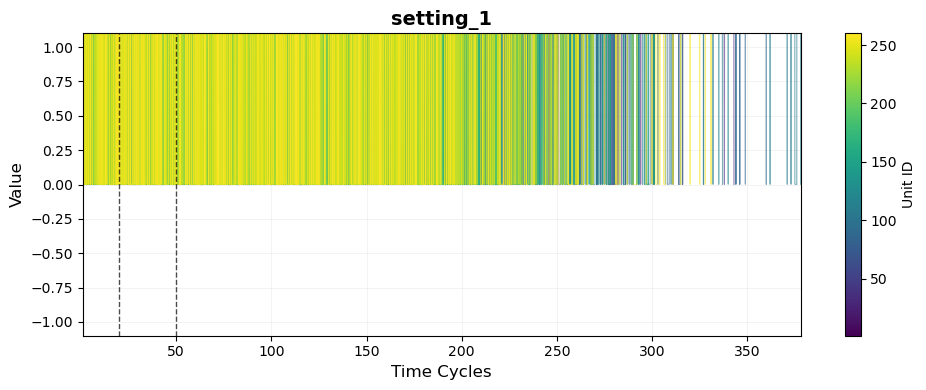

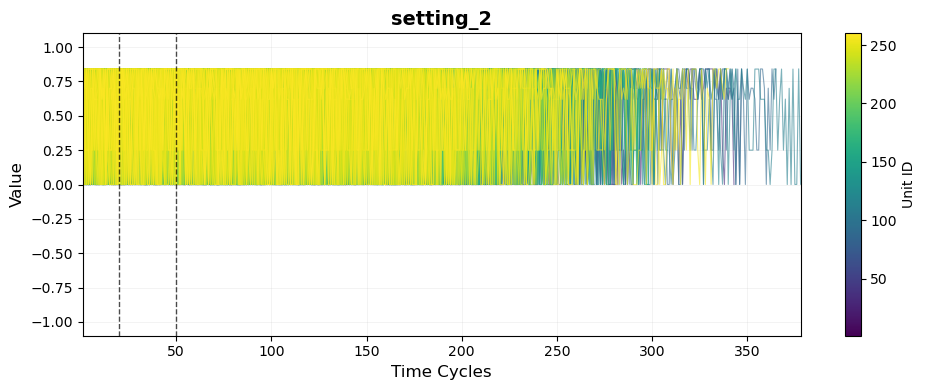

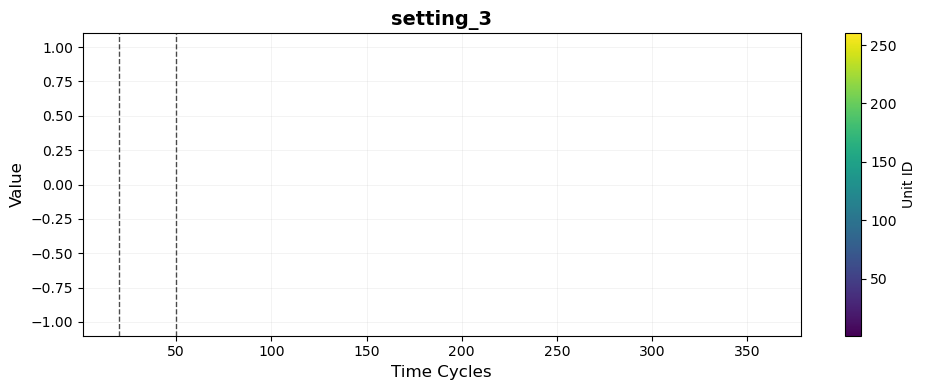

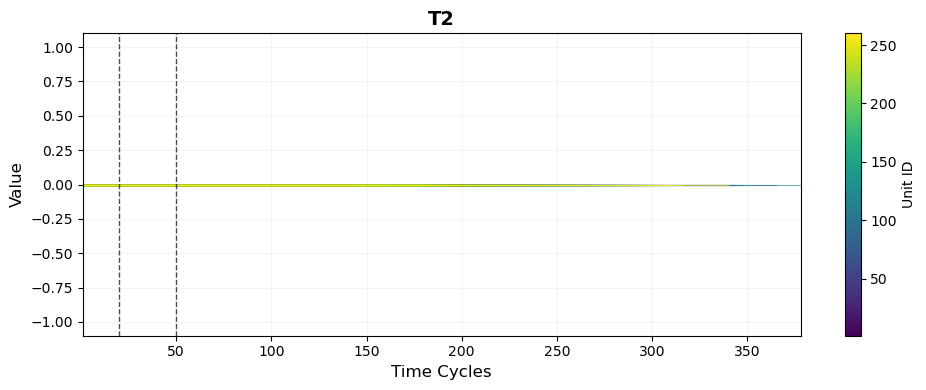

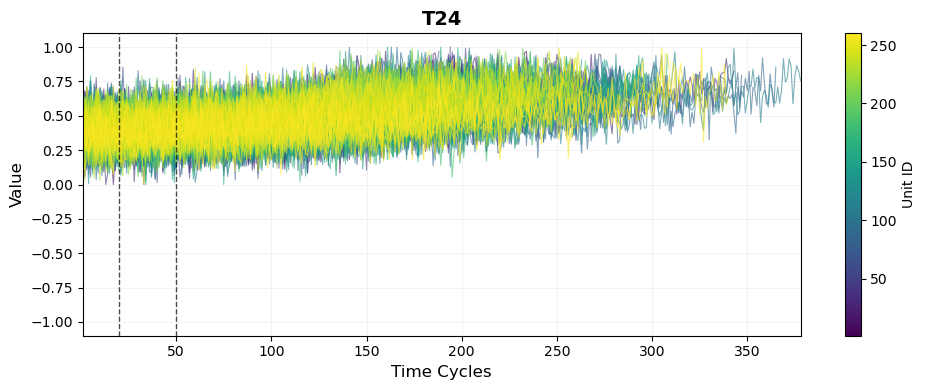

...

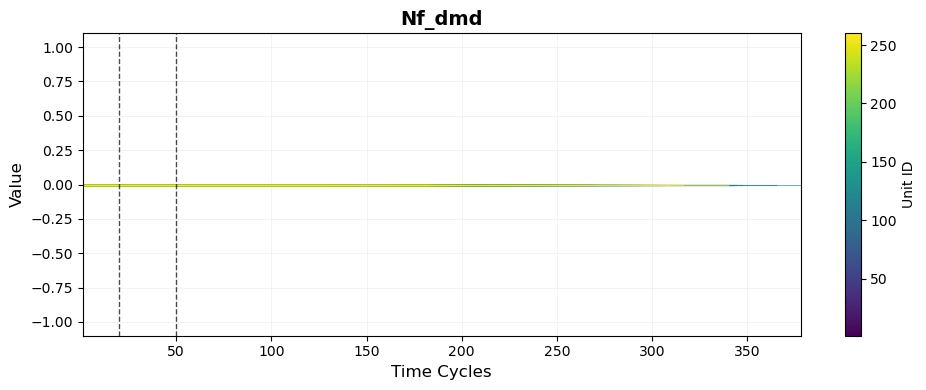

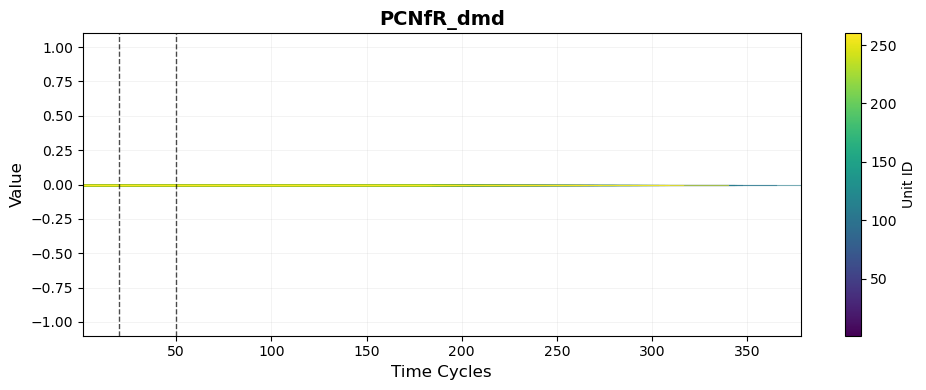

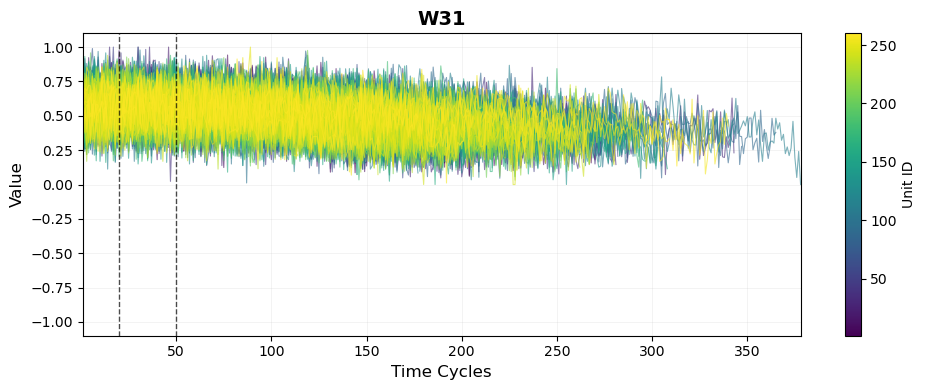

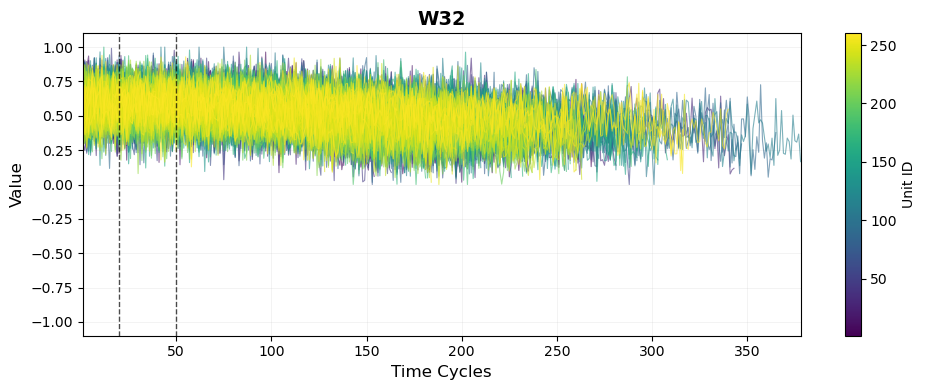

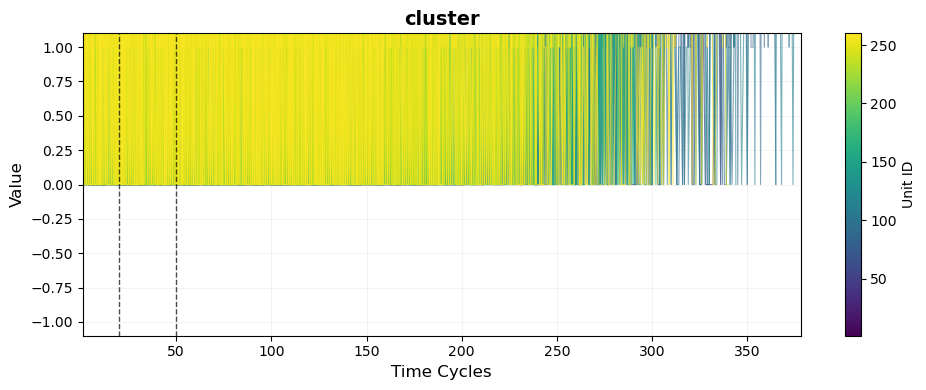

In [195]:
# Create the plot
x_lim = [train_data['time_cycles'].min(), train_data['time_cycles'].max()]
fig, ax = plot_all_units_overlay_colorbar(train_data_cluster_scaled, x_lim = x_lim, vertical_lines=[20, 50])
#plt.savefig('my_plot.png', dpi=300, bbox_inches='tight')
plt.show()

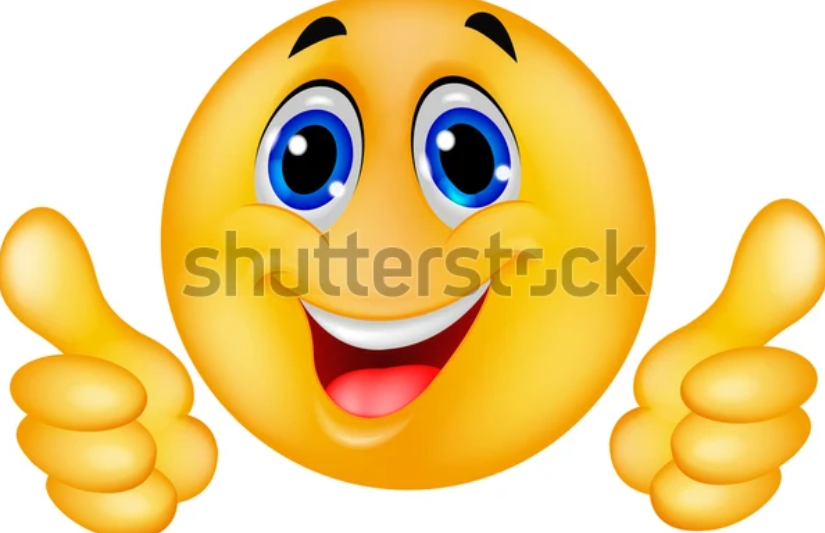